In [199]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ETFunctions
import matplotlib.dates as mdates
import GraphHelpers as GH
from bisect import bisect_left, bisect_right
%matplotlib inline

In [200]:
CBcolors = {
    'blue':    '#377eb8', 
    'orange':  '#ff7f00',
    'pink':    '#f781bf',
    'brown':   '#a65628',
    'green':   '#4daf4a',
    'purple':  '#984ea3',
    'gray':    '#999999',
    'red':     '#e41a1c',
    'yellow':  '#dede00'
    #'cyan':    '#9edae5'
} 

Categories = ['Fodder Bulb', 'Fodder Cereal', 'Fodder Grass', 'Fodder Leafy brassica', 
              'Grain Cereal', 'Grain Oilseed', 'Grain Pulse', 
              'Seed Fodder', 'Seed Forage', 'Seed Fruit', 'Seed Vegetable',
              'Vegetable Fruit', 'Vegetable Green', 'Vegetable Pulse','Vegetable Root',
              'Green manure Green manure','Potato Potato',]
colorsnames = ['darkgreen', 'seagreen', 'limegreen', 'greenyellow',
               'darkorange', 'orange', 'navajowhite',
               'purple', 'm', 'violet','thistle',
               'darkblue', 'blue', 'cornflowerblue', 'lightsteelblue',
               'brown','gold']
hatchStyles = ['/', '\\', 'x', '|',
               '/', '\\', '|', 
               '/', '\\', '|', 'x',
               '/', '\\', '|', 'x',
               '/', '\\']
sortDict = dict(zip(Categories,range(17)))

colors = pd.DataFrame(index = Categories,columns=['col'],data = colorsnames)
hatches = pd.DataFrame(index = Categories,columns=['hat'],data = hatchStyles)

VarNameMap = {'Typical Fresh Yield (t/ha)':'FinalYield', 
              'Typical HI':'HarvestIndex',
              'Moisture %':'Moisture%Product',
              'Product [N]':'N%Product',
              'Stover [N]':'N%Stover',
              'Typical Population (/ha)':'Population (/ha)'}
      

In [201]:
ObsData = pd.read_excel("Observed crop parameters.xlsx", sheet_name='SVS Observed Data',na_values='N/A')

In [202]:
# Data extracted from CropData.cs InitialiseCropData() method
CropCoefficients = pd.read_csv('CropCoefficientTableFull.csv')
CropCoefficients.set_index(['UniqueName'],inplace=True)

TestCropFilter = CropCoefficients.EndUse != 'Testing'
CropCoefficients = CropCoefficients.loc[TestCropFilter,:]

def makeCategory(enduse, group):
    return  enduse + " " + group
CropCoefficients.loc[:,'Category'] = [makeCategory(CropCoefficients.loc[x,'EndUse'], CropCoefficients.loc[x,'Group']) for x in CropCoefficients.index]
CropCoefficients.sort_values(by = 'Category', key = lambda x:x.map(sortDict), inplace=True)

def makeTypYield(typPopn, typYield, units):
    if units == 't/ha':
        return typYield
    if units == 'kg/head':
        return (typYield * typPopn) / 1000
CropCoefficients.loc[:,'Typical Fresh Yield (t/ha)'] = [makeTypYield(CropCoefficients.loc[x,'Typical Population (/ha)'], 
                                                              CropCoefficients.loc[x,'Typical Yield'],
                                                              CropCoefficients.loc[x,'Typical Yield Units']) for x in CropCoefficients.index]


def calcTypNUptake(crop):
    fTotalProductDwt = CropCoefficients.loc[crop,'Typical Fresh Yield (t/ha)'] * 1000 * (1 - CropCoefficients.loc[crop,"Moisture %"] / 100)
    if CropCoefficients.loc[crop,'Yield type'] == "Standing DM":
        fTotalProductDwt *= CropCoefficients.loc[crop,'Typical HI']
    fStoverDwt = fTotalProductDwt * 1 / CropCoefficients.loc[crop,'Typical HI'] - fTotalProductDwt
    fRootDwt = (fStoverDwt + fTotalProductDwt) * CropCoefficients.loc[crop,'P Root'];
    fRootN =  fRootDwt * CropCoefficients.loc[crop,'Root [N]'] / 100
    fStoverN = fStoverDwt * CropCoefficients.loc[crop,'Stover [N]'] / 100
    fProductN = fTotalProductDwt * CropCoefficients.loc[crop,'Product [N]'] / 100
    fCropN = fRootN + fStoverN  + fProductN
    return np.round(fCropN,0)
    
CropCoefficients.loc[:,'TypicalNUptake'] = [calcTypNUptake(x) for x in CropCoefficients.index]

def makeName(crop):
    return CropCoefficients.loc[crop,'Colloquial Name'] + " " + CropCoefficients.loc[crop,'Type']
CropCoefficients.loc[:,'Name'] = [makeName(x) for x in CropCoefficients.index]

In [203]:
CropCoefficients.columns

Index(['Index', 'EndUse', 'Group', 'Colloquial Name', 'Type', 'Family',
       'Genus', 'Specific epithet', 'Sub species', 'Species name',
       'Epithet and sub species', 'Typical Establish Stage',
       'Typical Establish month', 'Typical Harvest Stage',
       'Typical Harvest month', 'Typical Yield', 'Typical Yield Units',
       'Yield type', 'Typical Population (/ha)', 'TotalOrDry',
       'Typical Dressing Loss %', 'Typical Field Loss %', 'Typical HI',
       'HI Range', 'Moisture %', 'P Root', 'Max RD', 'A cover', 'rCover',
       'Root [N]', 'Stover [N]', 'Product [N]', 'TtEmerg', 'Tbase', 'Category',
       'Typical Fresh Yield (t/ha)', 'TypicalNUptake', 'Name'],
      dtype='object')

In [204]:
def plotParamDistribution(Graph,var,legloc,valpos,plotObs = False):
    Axis = Graph.add_subplot(1,1,1)
    z = 0
    for cat in Categories:
        datafilter = CropCoefficients.loc[:,'Category'] == cat
        data = CropCoefficients.loc[datafilter,var]
        col = colors.loc[cat,'col']
        hat = hatches.loc[cat,'hat']
        for c in data.index:
            cYield = data[c]
            Axis.barh(z,cYield,height = 0.7,ec = col,fc='white',lw=5,hatch = hat,
                      orientation='horizontal',label=cat)
            plt.plot(cYield+valpos,z,marker=r'$'+str(cYield)+'$',ms=45,color = col)
            
            if (plotObs==True):
                xs = ObsData.loc[ObsData.loc[:,'SVS Crop']==c,VarNameMap[var]].dropna()
                ys = [z] * len(xs)
                plt.plot(xs,ys,'x',ms=12,color = col,mew=3)
                plt.plot(np.median(xs),z,'o',ms=15, mec = col, mfc='white',mew=5)
            
            if var == 'Typyld':
                plt.text(cYield+6,z-.3,'t/ha ('+CropCoefficients.loc[c,'TypicalYieldUnits']+')',
                         fontsize=15,horizontalalignment='left')
            z -=1
    plt.title(var,fontsize=50)
    plt.yticks(range(-CropCoefficients.index.size+1,1),list(reversed(CropCoefficients.Name.values)),
               fontsize=25)
    Axis.spines['right'].set_visible(False)
    Axis.spines['top'].set_visible(False)
    Axis.spines['left'].set_visible(False)
    Axis.spines['bottom'].set_visible(False)
    plt.tick_params(axis='x', which='both', bottom=False,top=False, labelbottom=False)
    plt.ylim(-CropCoefficients.index.size,0.5)
    GH.AddLegend(legloc,26,'Catagory')
    #plt.legend(loc=1)

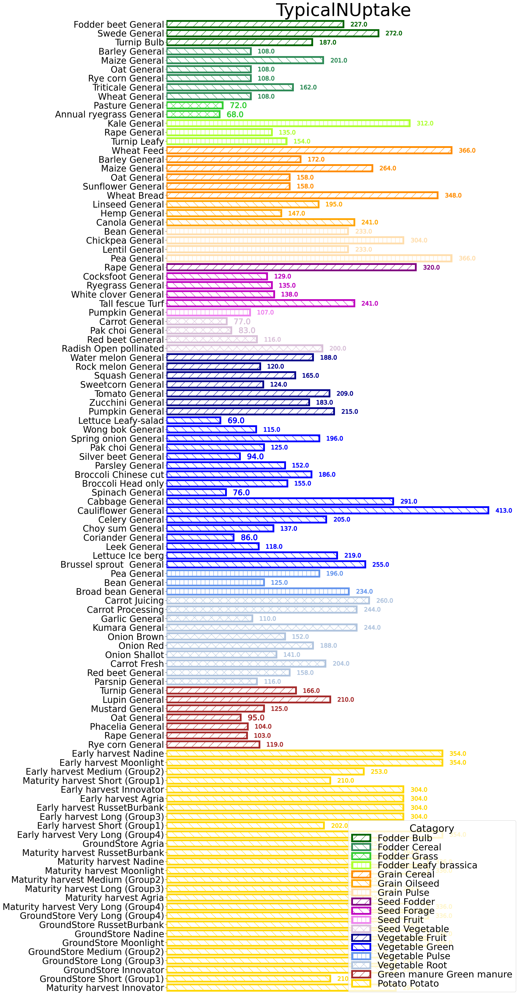

In [205]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'TypicalNUptake',4,20)
Graph.patch.set_facecolor('white')

C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


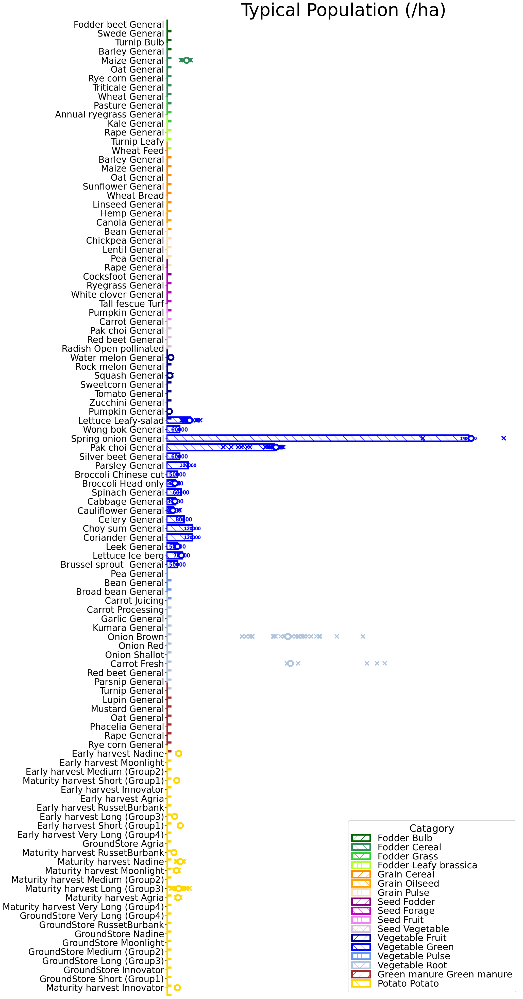

In [206]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Typical Population (/ha)',4,0,True)
Graph.patch.set_facecolor('white')

C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


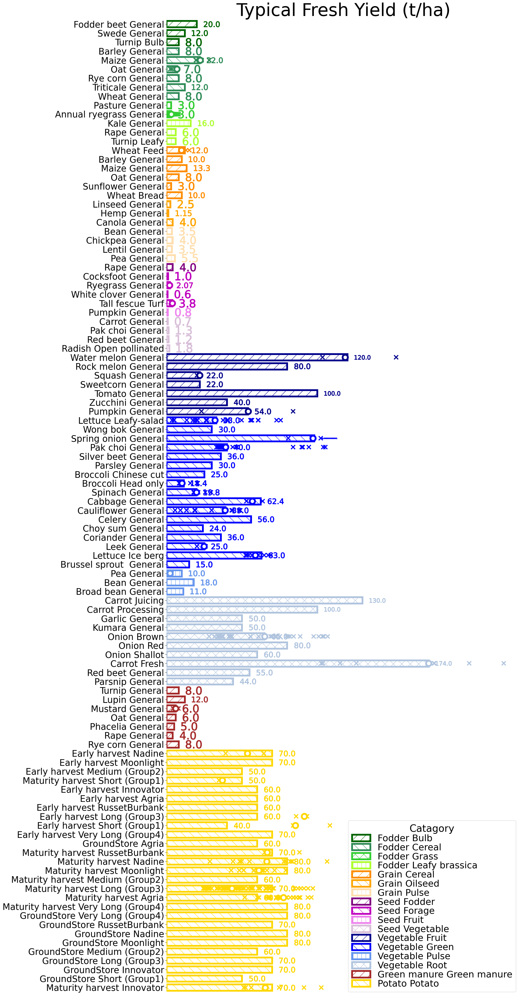

In [207]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Typical Fresh Yield (t/ha)',4,10,True)
Graph.patch.set_facecolor('white')

C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


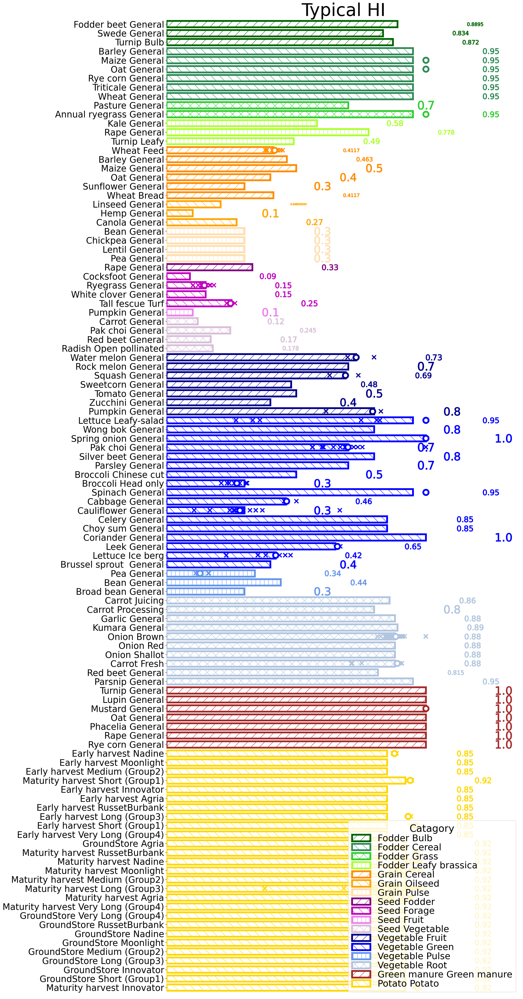

In [208]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Typical HI',4,.3,True)
Graph.patch.set_facecolor('white')

C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


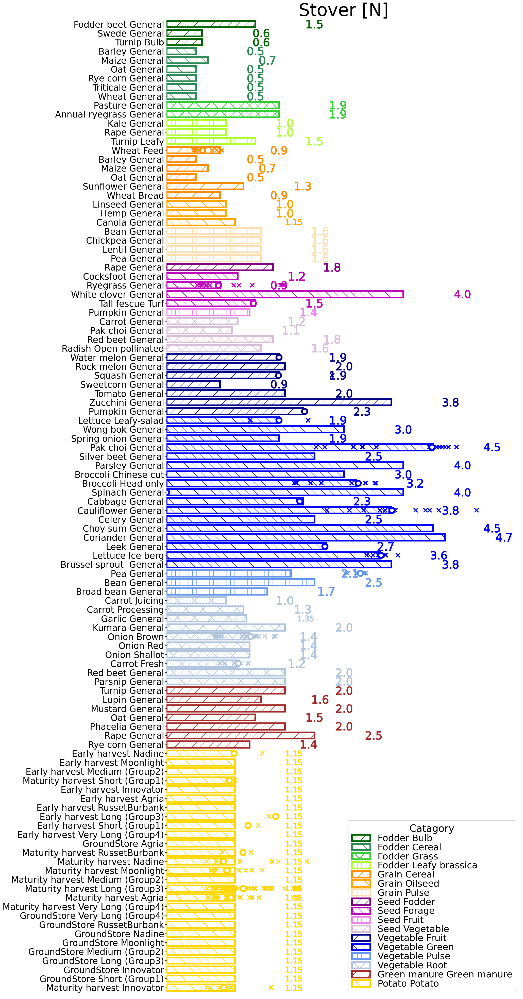

In [209]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Stover [N]',4,1,True)
Graph.patch.set_facecolor('white')

C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


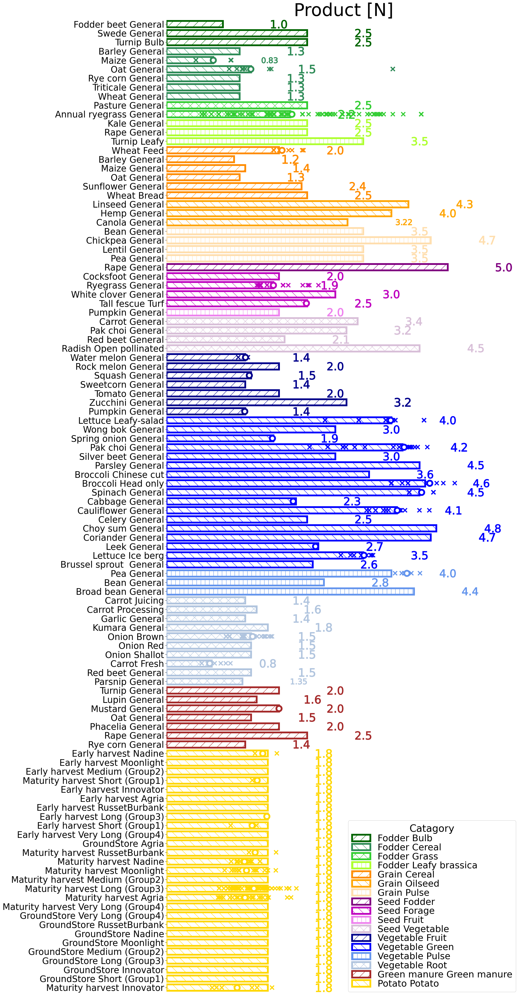

In [210]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Product [N]',4,1,True)
Graph.patch.set_facecolor('white')

C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Cflhxb\AppData\Local\anaconda3\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


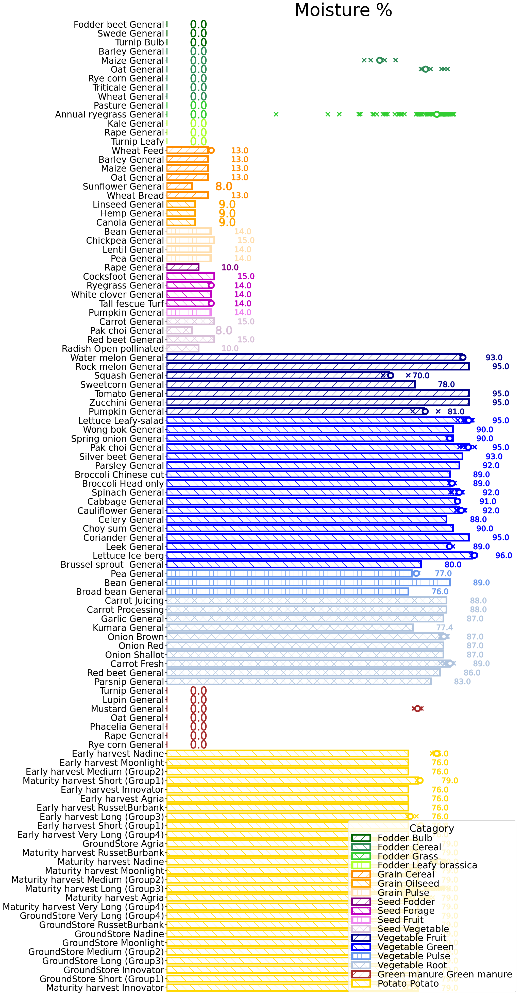

In [211]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Moisture %',4,10,True)
Graph.patch.set_facecolor('white')

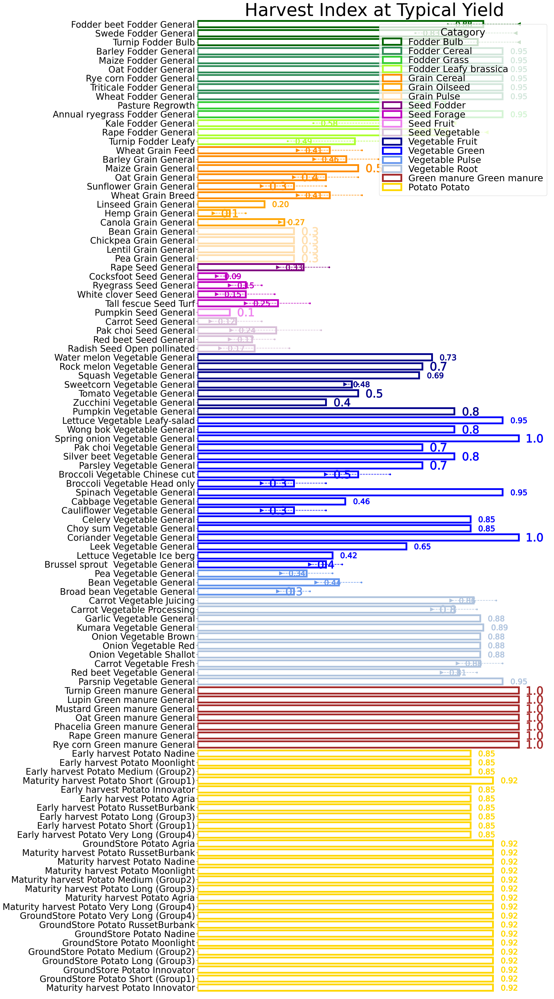

In [212]:
Graph = plt.figure(figsize=(18,50))
Axis = Graph.add_subplot(1,1,1)
z = 0
for cat in Categories:
    datafilter = CropCoefficients.loc[:,'Category'] == cat
    data = CropCoefficients.loc[datafilter,['Typical Fresh Yield (t/ha)', 'Typical HI', 'HI Range']]
    col = colors.loc[cat,'col']
    for c in data.index:
        cHI = data.loc[c,'Typical HI']
        cHIlow = data.loc[c,'Typical HI'] + (data.loc[c,'HI Range'])
        cHIhigh = data.loc[c,'Typical HI'] - (data.loc[c,'HI Range'])
        Axis.barh(z,cHI,height = 0.7,ec = col,fc='white',lw=5,
                  orientation='horizontal',label=cat)
        if data.loc[c,'HI Range'] == 0.0:
            plt.plot(cHI+0.05,z,marker=r'$'+str(cHI)[:4]+'$',ms=45,color = col)
        else:
            plt.plot([cHIlow,cHIhigh],[z,z],'o--',color=col,ms=4)
            if data.loc[c,'HI Range'] > 0.0:
                plt.plot([cHIhigh],[z],'>',color=col,ms=10)
                plt.plot(cHIhigh+0.05,z,marker=r'$'+str(cHI)[:4]+'$',ms=45,color = col)
            else:
                plt.plot([cHIhigh],[z],'<',color=col,ms=10)
                plt.plot(cHIlow+0.05,z,marker=r'$'+str(cHI)[:4]+'$',ms=45,color = col)
        z -=1
plt.title('Harvest Index at Typical Yield',fontsize=50)
plt.yticks(range(-CropCoefficients.index.size+1,1),list(reversed(CropCoefficients.index.values)),
           fontsize=25)
Axis.spines['right'].set_visible(False)
Axis.spines['top'].set_visible(False)
Axis.spines['left'].set_visible(False)
Axis.spines['bottom'].set_visible(False)
plt.tick_params(axis='x', which='both', bottom=False,top=False, labelbottom=False)
plt.ylim(-CropCoefficients.index.size,0.5)
GH.AddLegend(1,26,'Catagory')
Graph.patch.set_facecolor('white')

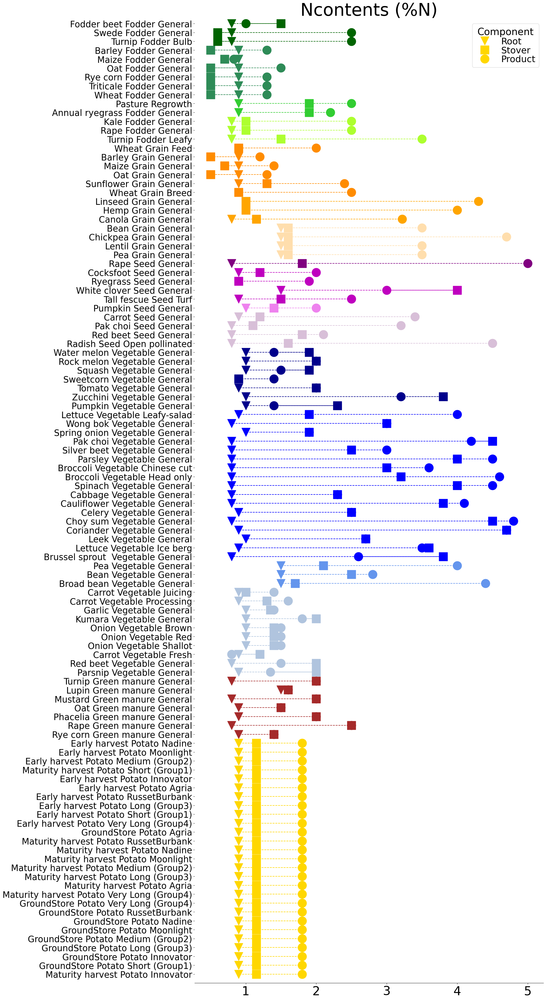

In [213]:
Graph = plt.figure(figsize=(18,50))
Axis = Graph.add_subplot(1,1,1)
z = 0
for cat in Categories:
    datafilter = CropCoefficients.loc[:,'Category'] == cat
    data = CropCoefficients.loc[datafilter,['Root [N]', 'Stover [N]', 'Product [N]']]
    col = colors.loc[cat,'col']
    for c in data.index:
        plt.plot(data.loc[c,'Root [N]'],z,'v',color=col,ms=25,label='Root')
        plt.plot(data.loc[c,'Stover [N]'],z,'s',color=col,ms=25,label='Stover')
        plt.plot(data.loc[c,'Product [N]'],z,'o',color=col,ms=25,label='Product')
        plt.plot([data.loc[c,'Product [N]'],data.loc[c,'Stover [N]'],data.loc[c,'Root [N]']],
                [z,z,z],'--',color=col)
        z -=1
plt.title('Ncontents (%N)',fontsize=50)
plt.yticks(range(-CropCoefficients.index.size+1,1),list(reversed(CropCoefficients.index.values)),
           fontsize=25)
Axis.spines['right'].set_visible(False)
Axis.spines['top'].set_visible(False)
Axis.spines['left'].set_visible(False)
#Axis.spines['bottom'].set_visible(False)
plt.tick_params(axis='x', labelsize=35)
plt.ylim(-CropCoefficients.index.size,0.5)
GH.AddLegend(1,26,'Component')
Graph.patch.set_facecolor('white')

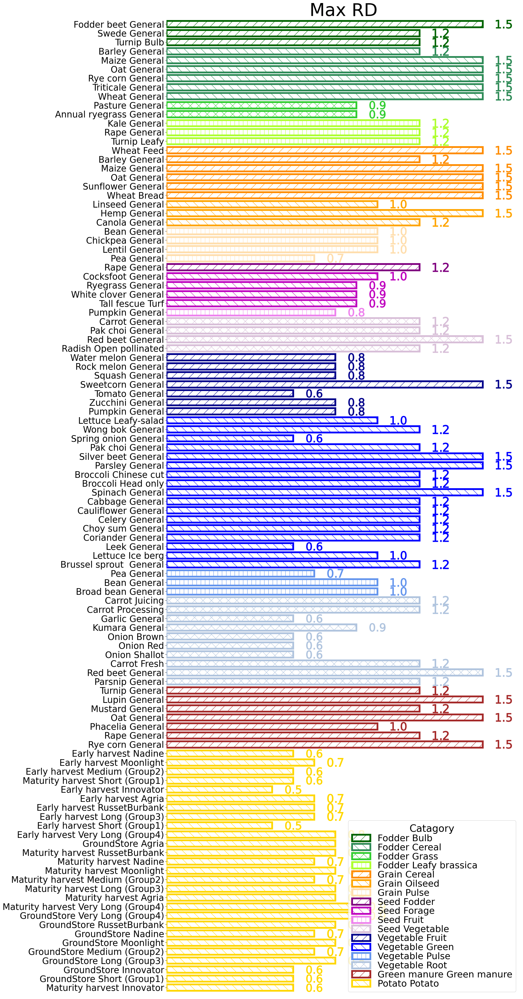

In [214]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Max RD',4,.1)
Graph.patch.set_facecolor('white')

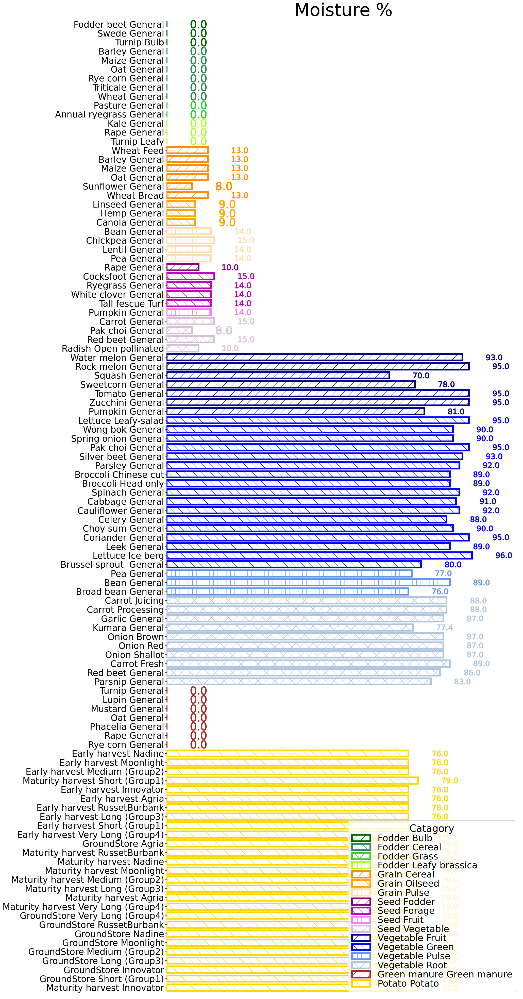

In [220]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Moisture %',4,10)
Graph.patch.set_facecolor('white')

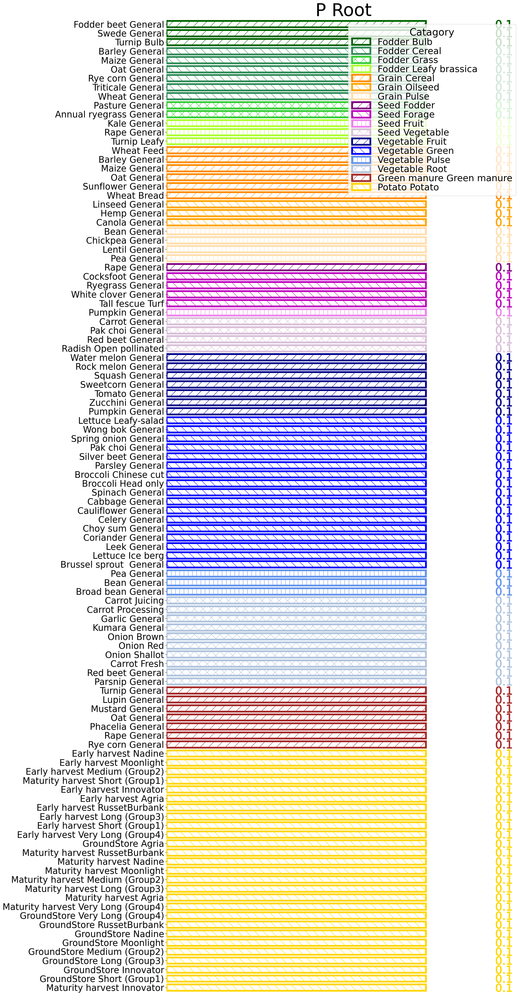

In [216]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'P Root',1,.03)
Graph.patch.set_facecolor('white')

In [217]:
ObsData.columns

Index(['Workstream', 'Unnamed: 1', 'Crop', 'Variety', 'SVS Crop',
       'Site Number', 'Replicate', 'Harvest', 'Irrigation Treatment',
       'Nitrogen Treatment', 'FinalYield', 'HarvestIndex', 'Moisture%Product',
       'N%Product', 'N%Stover', 'Population (/ha)', 'kg/head', 'Comments '],
      dtype='object')

In [218]:
ObsData.loc[:,['SVS Crop','FinalYield', 'HarvestIndex', 'Moisture%Product','N%Product', 'N%Stover', 'Population (/ha)',
               'kg/head']].groupby(by='SVS Crop').median().loc['Cauliflower Vegetable General',:]

FinalYield             38.821581
HarvestIndex            0.282561
Moisture%Product       92.591309
N%Product               4.103547
N%Stover                3.809276
Population (/ha)    29411.764706
kg/head                 1.365190
Name: Cauliflower Vegetable General, dtype: float64